In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from numpy import dot
from numpy.linalg import norm

In [2]:
weigths_path = '../pretrained/sketch_embedding.h5'
embedding_model = load_model(weigths_path)

In [3]:
df = pd.read_csv('../embeddings.csv')

In [4]:
def sketchify(jc):

    jc = np.uint8(jc)
    
    scale_percent = 1

    width = int(jc.shape[1]*scale_percent)
    height = int(jc.shape[0]*scale_percent)

    dim = (width,height)
    resized = cv2.resize(jc,dim,interpolation = cv2.INTER_AREA)

    kernel_sharpening = np.array([[-1,-1,-1], 
                                  [-1, 9,-1],
                                  [-1,-1,-1]])
    sharpened = cv2.filter2D(resized,-1,kernel_sharpening)



    gray = cv2.cvtColor(sharpened , cv2.COLOR_BGR2GRAY)
    inv = 255-gray
    gauss = cv2.GaussianBlur(inv,ksize=(15,15),sigmaX=0,sigmaY=0)

    def dodgeV2(image,mask):
        return cv2.divide(image,255-mask,scale=256)

    pencil_jc = 255 - dodgeV2(gray,gauss)
    img = np.zeros(jc.shape)
    img[:,:,0] = pencil_jc
    img[:,:,1] = pencil_jc
    img[:,:,2] = pencil_jc
    return img

/Users/chizhang/opt/anaconda3/envs/tensorflow/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


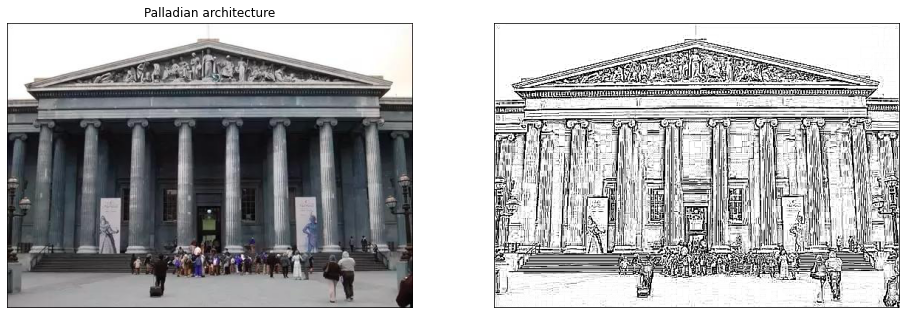

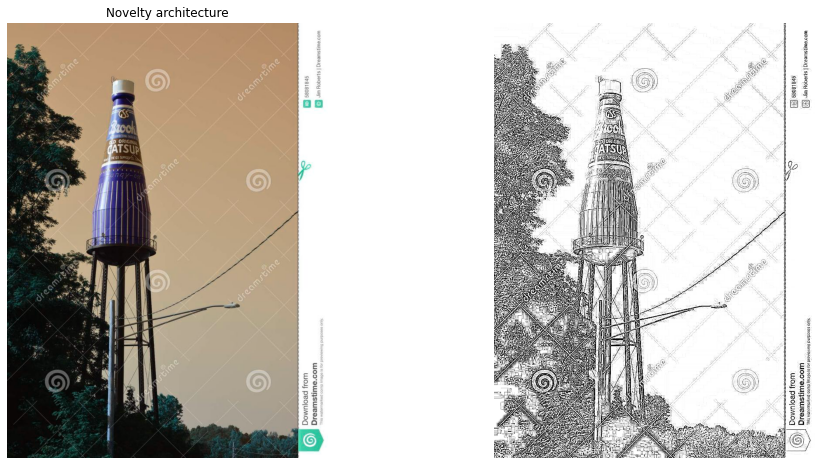

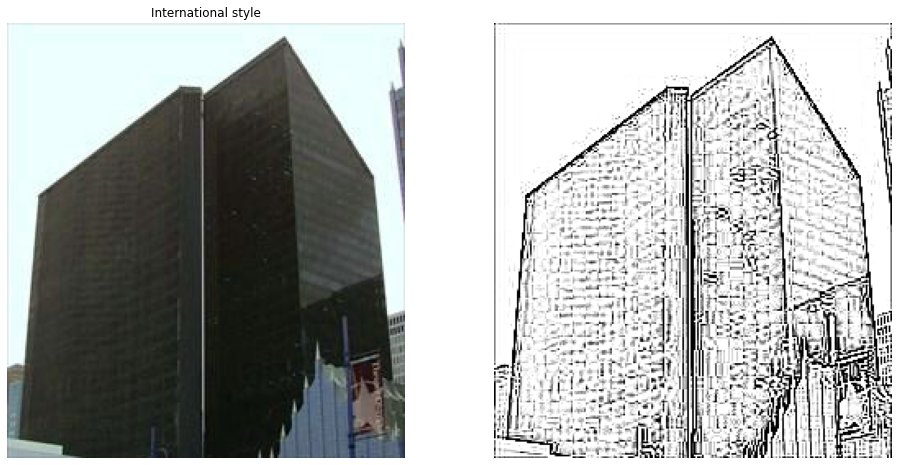

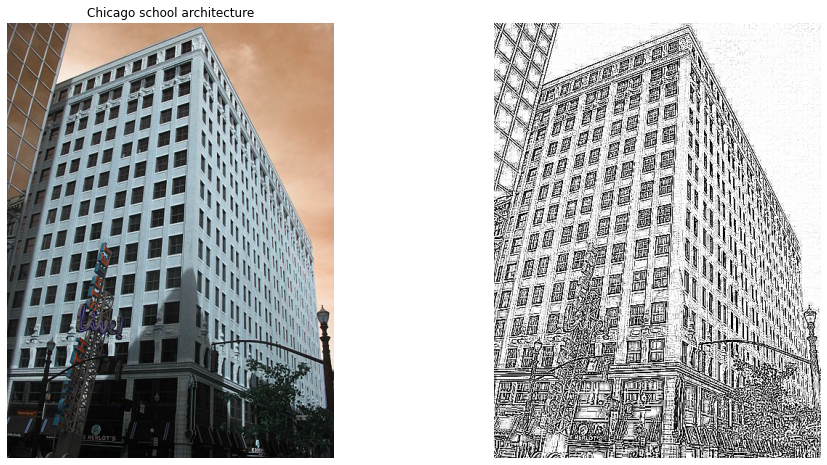

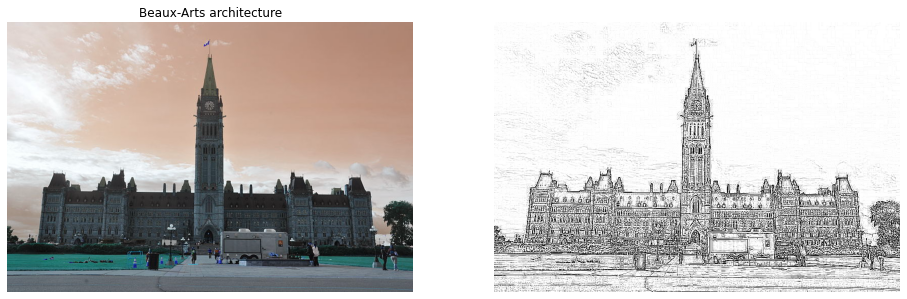

...

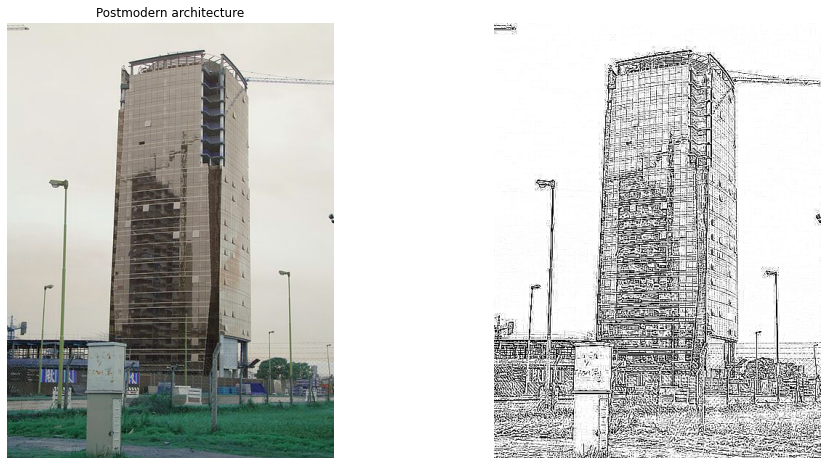

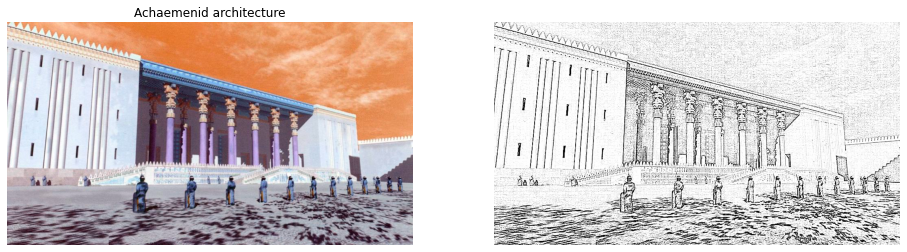

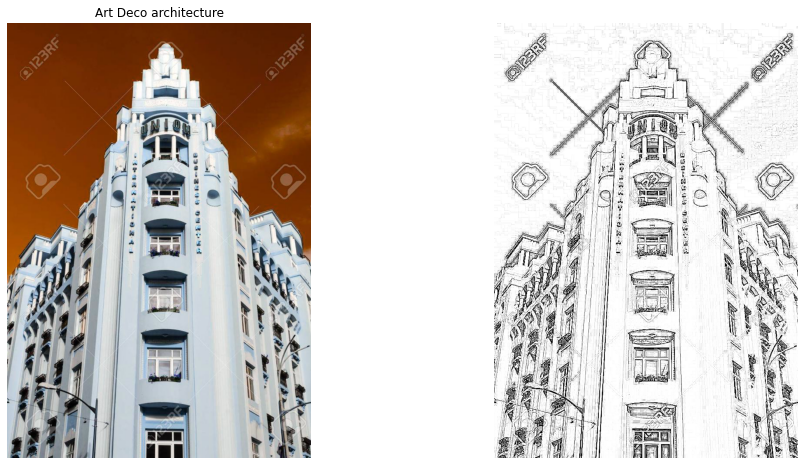

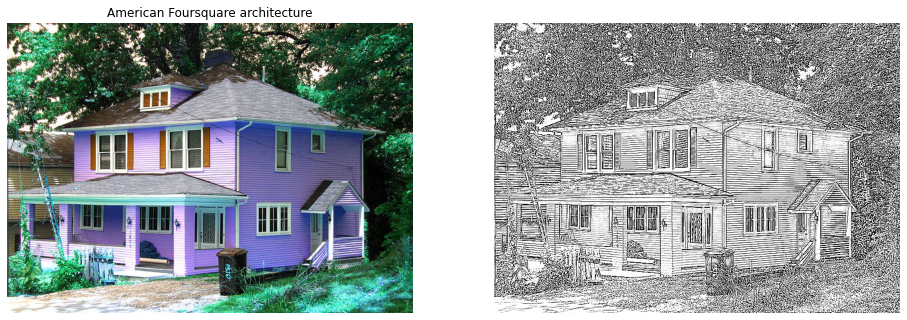

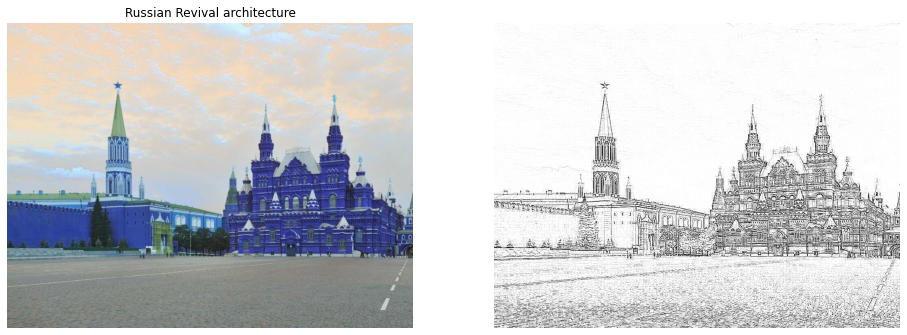

In [33]:
filenames = {}
for tag in df['class'].unique():
    filename = df.loc[df['class'] == tag,'filepath'].iloc[2]
    img = cv2.imread(filename)
    sketches = sketchify(img)
    fig, ax = plt.subplots(1,2,figsize = (16,8))
    ax[0].imshow(img)
    ax[0].set_title(tag)
    ax[1].imshow(1-sketches/255)
    ax[0].axis('off')
    ax[1].axis('off')
    filenames[tag] = filename

In [34]:
validation_dataset = '../validation_image'

In [35]:
def get_embeedings(filepath):
    img = cv2.imread(filepath)
    img = cv2.resize(img,(256,256),interpolation = cv2.INTER_AREA)
    sketch_im = sketchify(img)/255
    embeddings = embedding_model.predict(sketch_im[np.newaxis,:,:,:])
    return embeddings[0]

def cosine_similarity(a,b):
    return dot(a, b)/(norm(a)*norm(b))

In [47]:
import os
os.listdir(validation_dataset)

['.DS_Store',
 'Tudor Revival architecture .png',
 'Palladian architecture.png',
 'International style .png',
 'WechatIMG409.jpeg']

In [50]:
sketch_file = 'Tudor Revival architecture.jpeg'
def get_rank_metrics(sketch_file):
    class_ = sketch_file.split('.')[0]
    path = filenames[class_]
    sketch_file = f'{validation_dataset}/{sketch_file}'
    embedding_vector = get_embeedings(sketch_file)
    df2 = df.copy()
    similarity = []
    for i in range(len(df)):
        similarity.append(cosine_similarity(df.iloc[i,2:],embedding_vector))

    df2['similarity'] = similarity

    sorted_ = df2.sort_values('similarity', ascending=False).reset_index().loc[:,['class','filepath']]

    img = cv2.imread(sorted_.loc[sorted_.filepath == path].filepath.values[0])
    plt.imshow(img)
    
    return sorted_.loc[sorted_.filepath == path].filepath.index[0]

1

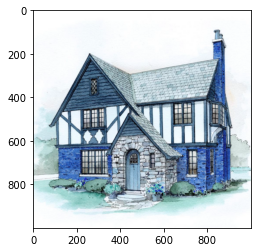

In [51]:
get_rank_metrics(sketch_file)